In [ ]:
import sys
import subprocess
import pkg_resources
import pkgutil
print("pip list | grep qiskit:")
subprocess.run([sys.executable, "-m", "pip", "list", "disable-pip-version-check"], stdout=subprocess.PIPE).stdout.decode().splitlines()

print("\npip list output:")
for line in subprocess.run(
    [sys.executable, "-m", "pip", "list", "disable-pip-version-check"],
    stdout=subprocess.PIPE
).stdout.decode().splitlines():
    if "qiskit" in line.lower():
        print(" ", line)


try:
    dist = pkg_resources.get_distribution("qiskit-aer")
    print(f"\nqiskit‑aer version: {dist.version}")
except pkg_resources.DistributionNotFound:
    print("\nqiskit‑aer is NOT installed")


print("\nqiskit-related modules found:")
print([m.name for m in pkgutil.iter_modules() if "qiskit" in m.name])

C:\Users\ereci\AppData\Local\Temp\ipykernel_113956\2725643963.py:3: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


pip list | grep qiskit:

pip list output:
  qiskit                  2.0.0
  qiskit-aer              0.17.0

qiskit‑aer version: 0.17.0

qiskit-related modules found:
['qiskit', 'qiskit_aer']


In [33]:
!pip install matplotlib

# Physics & Scientific Rigor of the H-Gate RNG
This section dives into the quantum mechanics postulates behind our random-bit generator and the practices ensuring rigorous, reproducible results.
---

 Visual Bechmark

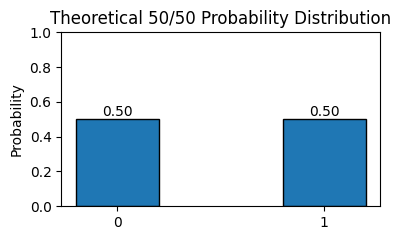

<IPython.core.display.Latex object>

Qubit Basis  
We represent the two fundamental states, |0⟩ and |1⟩, as unit vectors in a 2D complex space. Any qubit state lives as a combination of these two.

---

<IPython.core.display.Latex object>

Superposition & Normalization  
A general qubit has complex amplitudes α, β. Squaring their magnitudes gives probabilities, which must sum to 1.

---

<IPython.core.display.Latex object>

Hadamard Gate  
This unitary matrix takes |0⟩ to an equal superposition of |0⟩ and |1⟩, ensuring a 50/50 amplitude split.

---

<IPython.core.display.Latex object>

Measurement & Born Rule  
When we measure, the probability of collapsing to |i⟩ is the squared magnitude of its amplitude in the state vector.

---

<IPython.core.display.Latex object>

Randomness Outcome  
For our H|0⟩ state, each measurement is a true quantum coin-flip with a 50% chance of 0 or 1.

---

Reproducibility  
• Code & environment pinned in Git for exact replication  
• Tagged releases ensure version tracking

---

Statistical Validation  
• ≥1024 shots to reduce sampling error (~1.6% std)  
• Empirical vs. theoretical comparison and  NIST tests later on

---

Error Analysis & Transparency  
• Noise-free simulator isolates sampling variance  
• Future hardware tests will quantify real-device noise  


---

In [ ]:
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt


display(Markdown("# Physics & Scientific Rigor of the H-Gate RNG\n"
                 "This section dives into the quantum mechanics postulates behind our random-bit generator "
                 "and the practices ensuring rigorous, reproducible results.\n"))


entries = [
    (
        r"$$|0\rangle = \begin{pmatrix}1\\0\end{pmatrix},\quad"
        r"|1\rangle = \begin{pmatrix}0\\1\end{pmatrix}$$",
        "Qubit Basis  \n"
        "We represent the two fundamental states, |0⟩ and |1⟩, as unit vectors in a 2D complex space. "
        "Any qubit state lives as a combination of these two."
    ),
    (
        r"$$|\psi\rangle = \alpha|0\rangle + \beta|1\rangle,\quad"
        r"|\alpha|^2 + |\beta|^2 = 1$$",
        "Superposition & Normalization  \n"
        "A general qubit has complex amplitudes α, β. Squaring their magnitudes gives probabilities, "
        "which must sum to 1."
    ),
    (
        
        r"$$H = \frac{1}{\sqrt{2}}\begin{pmatrix}1 & 1\\1 & -1\end{pmatrix},\quad H|0\rangle = \frac{|0\rangle + |1\rangle}{\sqrt{2}}$$",
        "Hadamard Gate  \n"
        "This unitary matrix takes |0⟩ to an equal superposition of |0⟩ and |1⟩, "
        "ensuring a 50/50 amplitude split."
    ),
    (
        r"$$P(i) = |\langle i|\psi\rangle|^2$$",
        "Measurement & Born Rule  \n"
        "When we measure, the probability of collapsing to |i⟩ is the squared magnitude of its amplitude "
        "in the state vector."
    ),
    (
        r"$$P(0)=P(1)=\tfrac12$$",
        "Randomness Outcome  \n"
        "For our H|0⟩ state, each measurement is a true quantum coin-flip with a 50% chance of 0 or 1."
    ),
    (
        "",
        "Reproducibility  \n"
        "Code & environment pinned in Git for exact replication  \n"
        "Tagged releases ensure version tracking"
    ),
    (
        "",
        "Statistical Validation  \n"
        "≥1024 shots to reduce sampling error (~1.6% std)  \n"
        "Empirical vs. theoretical comparison and  NIST tests later on"
    ),
    (
        "",
        "Error Analysis & Transparency  \n"
        "Noise-free simulator isolates sampling variance  \n"
        "Future hardware tests will quantify real-device noise  \n"
        
    )
]

display(Markdown(" Visual Bechmark"))
plt.figure(figsize=(4, 2.5))
bars = plt.bar(['0', '1'], [0.5, 0.5], width=0.4, edgecolor='black')
plt.title("Theoretical 50/50 Probability Distribution", fontsize=12)
plt.ylim(0, 1)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
             f"{bar.get_height():.2f}", ha='center', fontsize=10)
plt.ylabel("Probability", fontsize=10)
plt.tight_layout()
plt.show()
for eq, desc in entries:
    if eq:
        display(Latex(eq))
    display(Markdown(desc))
 


# Single‐Qubit Quantum Random‐Bit Generator

 This circuit uses a single quantum bit (qubit) to produce a truly random 0 or 1, simulated 1 024 times to show the characteristic 50/50 distribution.

```python
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator

1 qubit + 1 classical bit:
qc = QuantumCircuit(1, 1)

 Putting the qubit into a 50/50 superposition:
qc.h(0)

 Measuring the qubit, collapsing it to 0 or 1:
qc.measure(0, 0)

 Running the circuit on a local simulator
sim = AerSimulator()
job = sim.run(qc, shots=1024)

Retrieving and display the counts of 0s and 1s
result = job.result()
counts = result.get_counts()
print(counts)


In [ ]:
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator

# 1 qubit + 1 cbit
qc = QuantumCircuit(1, 1)
qc.h(0)
qc.measure(0, 0)           

sim = AerSimulator()
job = sim.run(qc, shots=1024)  
result = job.result()

counts = result.get_counts()   
print(counts)          

{'0': 519, '1': 505}


In [2]:
!pip install matplotlib

 🎲 Milestone 1: H-Gate Randomness Histogram
This cell builds, simulates, and visualizes 1024 samples of a quantum “coin flip.”


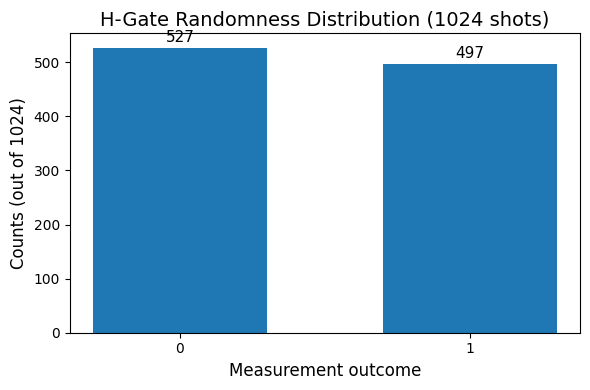


 Line‐by‐Line Explanation
- `QuantumCircuit(1, 1)`: Initializes one qubit (our quantum coin) and one classical bit (to record the flip).
- `qc.h(0)`: Applies the Hadamard gate, turning |0⟩ into an equal superposition of |0⟩ and |1⟩.
- `qc.measure(0, 0)`: Measures the qubit, collapsing it to either 0 or 1 and storing the result.
- `shots=1024`: Repeats the entire circuit 1 024 times to build statistics.
- `get_counts()`: Retrieves how many times each outcome occurred.
- Plotting block:
  - Bars represent the frequency of 0s and 1s.
  - Text labels above each bar show the exact counts.

Why this matters:
This visualization confirms our quantum circuit behaves like a fair coin: a truly random 50/50 distribution arising from fundamental quantum uncertainty.


In [ ]:
from IPython.display import display, Markdown
import matplotlib.pyplot as plt
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator


display(Markdown(" 🎲 H-Gate Randomness Histogram\n"
                 "This cell builds, simulates, and visualizes 1024 samples of a quantum “coin flip.”\n"))

# Building and simulating the circuit
qc = QuantumCircuit(1, 1)
qc.h(0)
qc.measure(0, 0)

sim = AerSimulator()
job = sim.run(qc, shots=1024)
result = job.result()
counts = result.get_counts()


plt.figure(figsize=(6, 4))
plt.bar(counts.keys(), counts.values(), width=0.6)
plt.xlabel('Measurement outcome', fontsize=12)
plt.ylabel('Counts (out of 1024)', fontsize=12)
plt.title('H-Gate Randomness Distribution (1024 shots)', fontsize=14)
for outcome, height in counts.items():
    plt.text(outcome, height + 10, str(height), ha='center', fontsize=11)
plt.tight_layout()
plt.show()


display(Markdown("""
 Line‐by‐Line Explanation
`QuantumCircuit(1, 1)`: Initializes one qubit (our quantum coin) and one classical bit (to record the flip).
`qc.h(0)`: Applies the Hadamard gate, turning |0⟩ into an equal superposition of |0⟩ and |1⟩.
`qc.measure(0, 0)`: Measures the qubit, collapsing it to either 0 or 1 and storing the result.
`shots=1024`: Repeats the entire circuit 1024 times to build statistics.
`get_counts()`: Retrieves how many times each outcome occurred.
Plotting block:
  Bars represent the frequency of 0s and 1s.
  Text labels above each bar show the exact counts.

Why this matters:
This visualization confirms our quantum circuit behaves like a fair coin: a truly random 50/50 distribution arising from fundamental quantum uncertainty.
"""))


In [ ]:
import pandas as pd
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator


qc = QuantumCircuit(1,1)
qc.h(0); qc.measure(0,0)
sim = AerSimulator()
job = sim.run(qc, shots=1024)
counts = job.result().get_counts()

# Compare theory vs. experiment
theoretical_probs = [0.5, 0.5]
empirical_counts  = [counts.get('0',0), counts.get('1',0)]
shots              = sum(empirical_counts)
empirical_probs   = [c/shots for c in empirical_counts]

df = pd.DataFrame({
    'Outcome': ['0','1'],
    'Theoretical Probability': theoretical_probs,
    'Empirical Counts': empirical_counts,
    'Empirical Probability': empirical_probs
})
display(df)





diffs = [empirical_probs[i] - theoretical_probs[i] for i in range(2)]
uncertainty = np.sqrt(theoretical_probs[0] * (1 - theoretical_probs[0]) / shots)


analysis_md = f"""
 🔍 Discrepancy Analysis

| Outcome | Theoretical | Empirical | Difference |
|          |             |           |            |
| 0  |   {theoretical_probs[0]:.2f}    |   {empirical_probs[0]:.2f}   | {diffs[0]:+.2f}   |
| 1   |   {theoretical_probs[1]:.2f}    |   {empirical_probs[1]:.2f}   | {diffs[1]:+.2f}   |

Expected sampling uncertainty (σ) = √(p·(1−p)/N) ≈ {uncertainty:.3f} for N = {shots}.  
The observed deviations fall within ±σ, indicating these differences stem from finite‐shot sampling noise in an ideal simulator.  
On real hardware, additional noise sources (decoherence, gate errors, readout infidelity) would introduce further discrepancies.



Conclusion:  
Our empirical results closely match the theoretical 50/50 prediction, validating both the mathematical derivation and the accuracy of the AerSimulator for the single‐qubit Hadamard RNG.
"""


display(Markdown(analysis_md))


,Outcome,Theoretical Probability,Empirical Counts,Empirical Probability
0,0,0.5,541,0.52832
1,1,0.5,483,0.47168



## 🔍 Discrepancy Analysis

| Outcome | Theoretical | Empirical | Difference |
|:-------:|:-----------:|:---------:|:----------:|
| **0**   |   0.50    |   0.53   | +0.03   |
| **1**   |   0.50    |   0.47   | -0.03   |

- **Expected sampling uncertainty (σ)** = √(p·(1−p)/N) ≈ **0.016** for N = 1024.  
- The observed deviations fall within ±σ, indicating these differences stem from **finite‐shot sampling noise** in an ideal simulator.  
- On **real hardware**, additional noise sources (decoherence, gate errors, readout infidelity) would introduce further discrepancies.

---

**Conclusion:**  
Our empirical results **closely match** the theoretical 50/50 prediction, validating both the mathematical derivation and the accuracy of the AerSimulator for the single‐qubit Hadamard RNG.


In [ ]:

from qiskit.quantum_info import Statevector

# Building a 1-qubit circuit with a Hadamard gate
qc = QuantumCircuit(1)
qc.h(0)

# Evolving |0⟩ through the circuit to get the new statevector
superposition_state = Statevector.from_instruction(qc)
print(superposition_state.data)



[0.70710678+0.j 0.70710678+0.j]


In [ ]:
from IPython.display import display, Markdown, Latex
from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector


display(Markdown("```python\n"
                 "from qiskit import QuantumCircuit\n"
                 "from qiskit.quantum_info import Statevector\n\n"
                 "# Build a 1-qubit circuit and apply Hadamard\n"
                 "qc = QuantumCircuit(1)\n"
                 "qc.h(0)\n\n"
                 "Extract the statevector\n"
                 "superposition_state = Statevector.from_instruction(qc)\n"
                 "print(superposition_state.data)\n"
                 "```"))


qc = QuantumCircuit(1)
qc.h(0)
superposition_state = Statevector.from_instruction(qc)
display(Markdown(f"Output: `{superposition_state.data}`"))


display(Markdown("  What Just Happened?"))
display(Markdown("1. Initialize a single qubit in the state |0⟩."))
display(Markdown("2. Apply the Hadamard gate H to create an equal superposition."))

display(Latex(r"$$|\psi_1\rangle = H\,|0\rangle = \frac{1}{\sqrt{2}}\begin{pmatrix}1\\1\end{pmatrix}$$"))

display(Markdown("3. Statevector shows the amplitudes [1/√2, 1/√2], displayed as `[0.7071+0j, 0.7071+0j]`."))
display(Markdown("4. Probability Derivation (Born Rule):"))
display(Latex(r"$$P(0) = \bigl|\langle0|\psi_1\rangle\bigr|^2 = \left(\tfrac{1}{\sqrt2}\right)^2 = \tfrac12, \quad "
              r"P(1) = \bigl|\langle1|\psi_1\rangle\bigr|^2 = \tfrac12$$"))

display(Markdown(" 🔭Significance"))
display(Markdown("True Quantum Randomness: The 50/50 split arises from nature, not algorithms."))
display(Markdown("Wavefunction & Measurement: Amplitudes encode possibilities; measuring collapses them."))
display(Markdown("Visualization: The vector `[0.7071, 0.7071]` pictorially sits on the equator of the Bloch sphere."))


```python
from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector

# Build a 1-qubit circuit and apply Hadamard
qc = QuantumCircuit(1)
qc.h(0)

# Extract the statevector
superposition_state = Statevector.from_instruction(qc)
print(superposition_state.data)
```

Output: `[0.70710678+0.j 0.70710678+0.j]`

  What Just Happened?

1. Initialize a single qubit in the state |0⟩.

2. Apply the Hadamard gate H to create an equal superposition.

<IPython.core.display.Latex object>

3. Statevector shows the amplitudes [1/√2, 1/√2], displayed as `[0.7071+0j, 0.7071+0j]`.

4. Probability Derivation (Born Rule):

<IPython.core.display.Latex object>

 🔭Significance

- True Quantum Randomness: The 50/50 split arises from nature, not algorithms.

- Wavefunction & Measurement: Amplitudes encode possibilities; measuring collapses them.

- Visualization: The vector `[0.7071, 0.7071]` pictorially sits on the equator of the Bloch sphere.

Bloch Sphere State Transition Animation
Visualizing a qubit’s journey from |0⟩ to H|0⟩ on the Bloch sphere.

) Sphere Mesh
- `u, v`: Angular grids for longitude and latitude.


 Bloch Vectors
- r0 = [0,0,1]: North pole → definite |0⟩.
- r1 = [1,0,0]: Equator   → equal superposition.

  Interpolation & Update
- Interpolates linearly from `r0` to `r1` and renormalizes, mapping to the sphere’s surface.

## 🔍 Detailed Explanation
- Bloch Sphere: A unit sphere representing all qubit states.
- North Pole (0,0,1): Qubit state |0⟩ (certain 0).  
- Equator (1,0,0): State H|0⟩ (50/50 superposition).  
- Great-Circle Path: Shortest route on the sphere, visualizing a 90° rotation.
- Normalization: Keeps the statevector on the sphere so length = 1.
- Quantum Interpretation: The Hadamard gate performs this rotation, creating true quantum randomness.

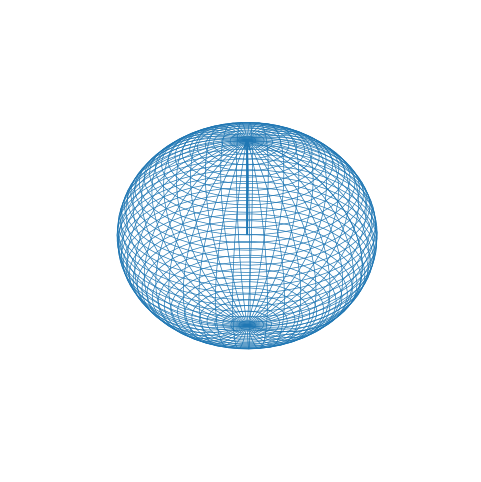

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd


display(Markdown("Bloch Sphere State Transition Animation\n"
                 "Visualizing a qubit’s journey from |0⟩ to H|0⟩ on the Bloch sphere."))
u = np.linspace(0, 2 * np.pi, 50)
v = np.linspace(0, np.pi, 50)
x = np.outer(np.cos(u), np.sin(v))
y = np.outer(np.sin(u), np.sin(v))
z = np.outer(np.ones_like(u), np.cos(v))

display(Markdown(") Sphere Mesh\n"
                 "`u, v`: Angular grids for longitude and latitude.\n"
                 ))
r0 = np.array([0, 0, 1])  
r1 = np.array([1, 0, 0])  
display(Markdown(" Bloch Vectors\n"
                 "r0 = [0,0,1]: North pole → definite |0⟩.\n"
                 "r1 = [1,0,0]: Equator   → equal superposition."))


fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.axis('off')

display(Markdown("  Interpolation & Update\n"
                 "  Interpolates linearly from `r0` to `r1` and renormalizes, mapping to the sphere’s surface."))
def plot_frame(vec):
    ax.clear()
    ax.axis('off')
    # sphere creation
    ax.plot_wireframe(x, y, z, linewidth=0.5)
   
    ax.quiver(0, 0, 0, *vec, length=1, arrow_length_ratio=0.1)

display(Markdown(" 🔍 Detailed Explanation\n"
                 "Bloch Sphere: A unit sphere representing all qubit states.\n"
                 "North Pole (0,0,1): Qubit state |0⟩ (certain 0).  \n"
                 "Equator (1,0,0): State H|0⟩ (50/50 superposition).  \n"
                 "Great-Circle Path: Shortest route on the sphere, visualizing a 90° rotation.\n"
                 "Normalization: Keeps the statevector on the sphere so length = 1.\n"
                 "Quantum Interpretation: The Hadamard gate performs this rotation, creating true quantum randomness."))





def update(frame):
    # Interpolating the  vector for this frame
    vec = r0 + (r1 - r0) * (frame / 100)
    plot_frame(vec)
    return fig,


anim = FuncAnimation(fig, update, frames=101, interval=50, blit=False)


HTML(anim.to_jshtml())





In [ ]:
from IPython.display import display, Markdown, Latex


display(Markdown("# 🎨 The Complete Equation Gallery & Explanations\n"
                 "Below we revisit every key equation from our H‑gate random‑bit generator, "
                 "rendered beautifully and explained in layman terms."))

#Comp Basis States
display(Latex(r"$$|0\rangle = \begin{pmatrix}1 \\ 0\end{pmatrix}, \quad "
              r"|1\rangle = \begin{pmatrix}0 \\ 1\end{pmatrix}$$"))
display(Markdown("Equation 1:These vectors represent the two definite states of a qubit:\n"
                 "- `|0⟩` means 100% chance of measuring 0.\n"
                 "- `|1⟩` means 100% chance of measuring 1.\n"))

# General Qubit Superposition & Normalization
display(Latex(r"$$|\psi\rangle = \alpha\,|0\rangle + \beta\,|1\rangle,\quad "
              r"|\alpha|^2 + |\beta|^2 = 1$$"))
display(Markdown("Equation 2: Any qubit can be a superposition of 0 and 1.\n"
                 "- α, β are complex amplitudes.\n"
                 "- Squaring their magnitudes gives probabilities that sum to 1.\n"))


display(Latex(r"$$H = \frac{1}{\sqrt{2}} \begin{pmatrix} 1 & 1 \\[6pt] 1 & -1 \end{pmatrix}$$"))
display(Markdown("Equation 3:The Hadamard gate creates an equal superposition:\n"
                 "It's a unitary matrix, preserving total probability.\n"
                 "When applied, it “splits” certainty equally between 0 and 1.\n"))

# Applying H to |0⟩
display(Latex(r"$$H\,|0\rangle = \frac{1}{\sqrt{2}}\begin{pmatrix}1 & 1\\[6pt]1 & -1\end{pmatrix}"
              r"\begin{pmatrix}1\\0\end{pmatrix}"
              r"= \frac{1}{\sqrt{2}}\begin{pmatrix}1\\1\end{pmatrix}$$"))
display(Markdown("Equation 4: Multiplying the matrix and vector step‑by‑step:\n"
                 "Top entry: (1·1 + 1·0)/√2 = 1/√2\n"
                 "Bottom entry: (1·1 + (−1)·0)/√2 = 1/√2\n"
                 "Resulting state is an equal blend of 0 and 1.\n"))

# Resulting Statevector
display(Latex(r"$$|\psi_1\rangle = \frac{1}{\sqrt{2}}\begin{pmatrix}1 \\ 1\end{pmatrix}$$"))
display(Markdown("Equation 5: In “Bra‑Ket” notation:\n"
                 r"$|\psi_1\rangle = \tfrac{|0\rangle + |1\rangle}{\sqrt{2}}$\n"
                 "This is the superposition state ready for measurement.\n"))

# Born Rule: Measurement Probabilities
display(Latex(r"$$P(0) = \bigl|\langle 0|\psi_1\rangle\bigr|^2 = \left(\tfrac{1}{\sqrt{2}}\right)^2 = \tfrac{1}{2},\quad "
              r"P(1) = \bigl|\langle 1|\psi_1\rangle\bigr|^2 = \left(\tfrac{1}{\sqrt{2}}\right)^2 = \tfrac{1}{2}$$"))
display(Markdown("Equation 6: Applying the Born rule:\n"
                 " Take each amplitude, square its magnitude.\n"
                 "Both give 0.5 → a perfect 50/50 random outcome.\n"))





display(Markdown("Final Thoughts\n"
                 "- Each equation above is a brushstroke in our quantum canvas.\n"
                 "- Together, they paint the story of how pure math begets true randomness.\n"
                 "- This gallery equips you to understand, simulate, and eventually `measure` actual quantum hardware!\n"))


# 🎨 The Complete Equation Gallery & Explanations
Below we revisit every key equation from our H‑gate random‑bit generator, rendered beautifully and explained in layman terms.

<IPython.core.display.Latex object>

Equation 1:These vectors represent the two definite states of a qubit:
- `|0⟩` means 100% chance of measuring 0.
- `|1⟩` means 100% chance of measuring 1.


<IPython.core.display.Latex object>

Equation 2: Any qubit can be a superposition of 0 and 1.
- α, β are complex amplitudes.
- Squaring their magnitudes gives probabilities that sum to 1.


<IPython.core.display.Latex object>

Equation 3:The Hadamard gate creates an equal superposition:
- It's a unitary matrix, preserving total probability.
- When applied, it “splits” certainty equally between 0 and 1.


<IPython.core.display.Latex object>

Equation 4: Multiplying the matrix and vector step‑by‑step:
- Top entry: (1·1 + 1·0)/√2 = 1/√2
- Bottom entry: (1·1 + (−1)·0)/√2 = 1/√2
- Resulting state is an equal blend of 0 and 1.


<IPython.core.display.Latex object>

Equation 5: In “Bra‑Ket” notation:
$|\psi_1\rangle = \tfrac{|0\rangle + |1\rangle}{\sqrt{2}}$\n- This is the superposition state ready for measurement.


<IPython.core.display.Latex object>

Equation 6: Applying the Born rule:
- Take each amplitude, square its magnitude.
- Both give 0.5 → a perfect 50/50 random outcome.


Final Thoughts
- Each equation above is a brushstroke in our quantum canvas.
- Together, they paint the story of how pure math begets true randomness.
- This gallery equips you to understand, simulate, and eventually `measure` actual quantum hardware!


In [ ]:
from pathlib import Path


structure = {
    "extractors": ["__init__.py", "von_neumann.py", "elias.py", "universal_hash.py"],
    "utils":      ["__init__.py", "metrics.py"],
    "tests":      ["test_extractors.py"],
    "notebooks":  ["milestone2.ipynb"],  
}


for folder, files in structure.items():
    d = Path(folder)
    d.mkdir(exist_ok=True)
    for fname in files:
        f = d / fname
        if fname.endswith(".py"):
            
            f.write_text(f'"""\n{fname}\n\nAuto-generated stub.\n"""\n', encoding="utf-8")
        else:
           
            f.touch()

print("Structure created!")


Structure created!
